$$ Credit \space Score $$
$$ Machine \space Learning \space 1 $$
$$ Support  \space Vector  \space Machine \space Classifier $$

# `01` Import Necessary Libraries

## `i` Default Libraries

In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import tarfile
import urllib.request

## `ii` Additional Libraries
Add imports for additional libraries you used throughout the notebook

In [2]:
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns

from imblearn.over_sampling import SMOTE

from sklearn.model_selection import  GridSearchCV, RandomizedSearchCV
from sklearn.svm import LinearSVC, SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score, f1_score

pd.set_option('display.max_columns', None)

import warnings
warnings.simplefilter("ignore")

----------------------------

# `02` Load Data

Note: Make sure the `Data` folder attached with the notebook is in the same path for this cell to work properly.

[Dataset Link](https://www.kaggle.com/datasets/parisrohan/credit-score-classification)

In [3]:
X_train = pd.read_csv('/content/X_train_final.csv')
y_train = pd.read_csv('/content/y_train.csv')
X_test = pd.read_csv('/content/X_test_final.csv')
y_test = pd.read_csv('/content/y_test.csv')

## `#` About Data:
- You are working as a data scientist in a global finance company. Over the years, the company has collected basic bank details and extensive credit-related information.
- The management wants to build an intelligent system to categorize customers into credit score brackets, reducing manual efforts.
- **Note**: This dataset has been cleaned, split, scaled, and transformed using logarithmic scaling. Additionally, some features have been generated through feature engineering.

---

### **Features:**
1. **Num_of_Delayed_Payment** – Total number of delayed payments by the customer.  
2. **Delay_from_due_date** – Average number of days a payment is delayed past its due date.  
3. **Credit_Utilization_Ratio** – Percentage of the credit limit that the customer is using.  
4. **Outstanding_Debt** – Total amount of debt the customer owes (in USD).  
5. **Total_EMI_per_month** – Total monthly Equated Monthly Installments (EMI) paid by the customer.  
6. **Payment_Behaviour** – Summary of the customer’s payment habits (e.g., full, minimum, late payments).  
7. **Changed_Credit_Limit** – Percentage change in the customer’s credit limit.  
8. **Annual_Income** – Yearly income of the customer (in USD).  
9. **Num_Credit_Inquiries** – Number of times the customer has applied for credit.  
10. **Credit_History_Age** – Number of years the customer has had a credit history.  
11. **Monthly_Balance** – Remaining balance at the end of each month (in USD).  
12. **Debt_to_Income_Ratio** – Ratio of outstanding debt to annual income.  
13. **EMI_to_Income_Ratio** – Ratio of total monthly EMI payments to monthly income.  
14. **Payment_Delay_Rate** – Rate at which the customer delays payments relative to total payments made.  

These transformed and engineered features are used to predict **Credit_Score** (Poor, Standard, or Good).

----------------

# `03` Exploratory Data Analysis (EDA)

## `i` Simple Analysis

Preview data, perform statistical data analysis and explore as much as needed to better understand the data set we're dealing with.

`Notes:`
- Feel free to look up EDA approaches online for inspiration (however you **must understand** everything and not copy paste).
- Make sure to add notes and insights extracted from your analysis.


In [4]:
X_train.head().style.background_gradient(cmap='Blues')

,Num_of_Delayed_Payment,Delay_from_due_date,Credit_Utilization_Ratio,Outstanding_Debt,Total_EMI_per_month,Payment_Behaviour,Changed_Credit_Limit,Annual_Income,Num_Credit_Inquiries,Credit_History_Age,Monthly_Balance,Debt_to_Income_Ratio,EMI_to_Income_Ratio,Payment_Delay_Rate
0,0.510826,-0.111111,0.449158,0.134656,0.036224,1,0.175983,-0.112804,0.405465,235.000000,0.313464,-0.454765,-1.929637,0.719369
1,0.000000,0.888889,0.341569,0.341194,-0.042331,5,1.224638,-0.105849,0.000000,178.000000,-0.430827,-1.346032,-0.780188,0.000000
2,0.105361,-0.500000,0.390738,-0.053592,-0.404447,4,-0.345756,-0.687473,0.154151,365.000000,-0.229863,0.103653,-0.479871,0.170557
3,-1.098612,0.388889,0.432582,0.456025,-0.408597,2,0.055901,0.455386,0.510826,188.000000,-1.396304,0.509156,-2.848055,-1.606403
4,-1.504077,-0.555556,0.406355,-0.514109,0.555343,5,0.086957,0.502028,0.000000,390.000000,2.285466,-0.380265,0.345712,-2.341222


In [5]:
X_train.shape

(5417, 14)

In [6]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5417 entries, 0 to 5416
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Num_of_Delayed_Payment    5417 non-null   float64
 1   Delay_from_due_date       5417 non-null   float64
 2   Credit_Utilization_Ratio  5417 non-null   float64
 3   Outstanding_Debt          5417 non-null   float64
 4   Total_EMI_per_month       5417 non-null   float64
 5   Payment_Behaviour         5417 non-null   int64  
 6   Changed_Credit_Limit      5417 non-null   float64
 7   Annual_Income             5417 non-null   float64
 8   Num_Credit_Inquiries      5417 non-null   float64
 9   Credit_History_Age        5417 non-null   float64
 10  Monthly_Balance           5417 non-null   float64
 11  Debt_to_Income_Ratio      5417 non-null   float64
 12  EMI_to_Income_Ratio       5417 non-null   float64
 13  Payment_Delay_Rate        5417 non-null   float64
dtypes: float

- As the data has been cleaned so the types are correct and there are no missing :)

In [7]:
#Check duplicates
X_train.duplicated().sum()

0

In [8]:
#check uniqueness
X_train.nunique()

,0
Num_of_Delayed_Payment,63
Delay_from_due_date,73
Credit_Utilization_Ratio,5417
Outstanding_Debt,846
Total_EMI_per_month,1524
Payment_Behaviour,6
Changed_Credit_Limit,1320
Annual_Income,898
Num_Credit_Inquiries,90
Credit_History_Age,403


In [9]:
X_train.describe(exclude = "object").T.style.background_gradient(cmap='Blues')

,count,mean,std,min,25%,50%,75%,max
Num_of_Delayed_Payment,5417.000000,-0.043997,0.774888,-2.197225,-0.251314,0.000000,0.367725,6.127112
Delay_from_due_date,5417.000000,0.188922,0.817836,-1.277778,-0.444444,0.000000,0.555556,2.722222
Credit_Utilization_Ratio,5417.000000,0.432438,0.185376,0.000000,0.275696,0.434656,0.586582,1.000000
Outstanding_Debt,5417.000000,-0.045166,0.686718,-1.499440,-0.553825,0.000000,0.453450,1.308708
Total_EMI_per_month,5417.000000,0.037514,0.641874,-1.042776,-0.429877,0.000000,0.500969,4.135580
Payment_Behaviour,5417.000000,2.927451,1.876667,0.000000,1.000000,3.000000,5.000000,5.000000
Changed_Credit_Limit,5417.000000,0.099325,0.713207,-1.633540,-0.432712,0.000000,0.567288,2.746377
Annual_Income,5417.000000,0.091851,0.748965,-1.136506,-0.452308,0.000000,0.492351,6.055986
Num_Credit_Inquiries,5417.000000,-0.031944,0.924683,-1.791759,-0.405465,0.000000,0.510826,6.068811
Credit_History_Age,5417.000000,224.345948,93.134333,1.000000,162.000000,222.000000,296.000000,403.000000


### **Insights:**  

- **Most customers pay on time**, but some frequently delay payments.  
- **Credit utilization is moderate**, with some maxing out their limits.  
- **Debt levels vary**, with a few having very high outstanding debt.  
- **Many customers have no active EMIs**, but some pay large amounts.  
- **Some always pay on time, while others frequently delay or pay the minimum.**  
- **Credit limits mostly remain stable**, but some experience big changes.  
- **Income is unevenly distributed**, with a few earning significantly more.  
- **Most have few credit inquiries**, but some apply for many loans.  
- **Credit history is generally long**, averaging 18+ years.  
- **Some struggle with negative balances**, despite most having positive ones.  
- **Debt-to-income and EMI-to-income ratios show financial extremes.**  


## `ii` Visual Analysis

Plot graphs and relations in order to gain more insights about the data set, identify patterns, and make assumptions.

`Notes:`
- Feel free to look up visual EDA approaches online for inspiration (however you **must understand** everything and not copy paste).
- Make sure to add notes and insights extracted from your analysis.

---
### <u>`i` Data Distribution :</u>

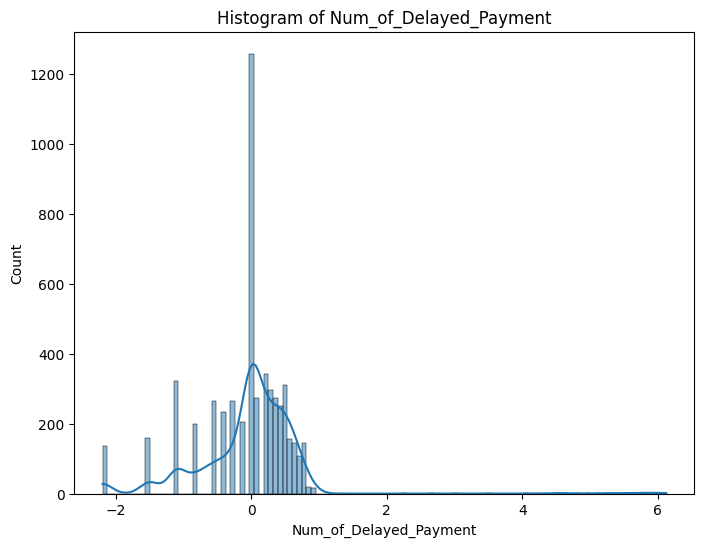

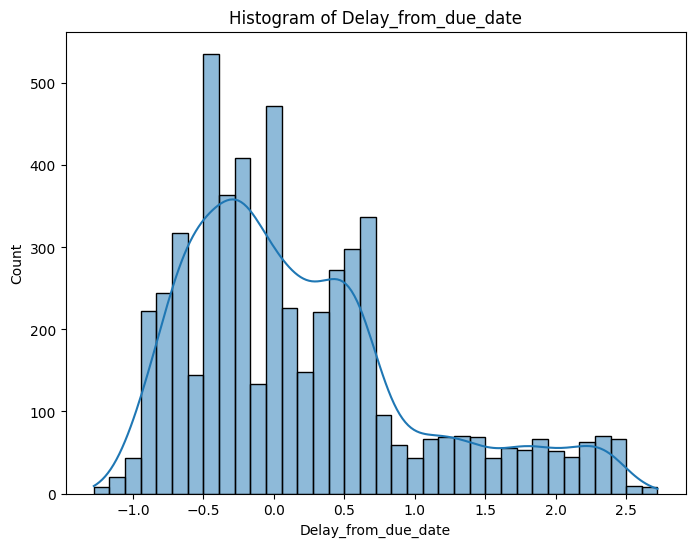

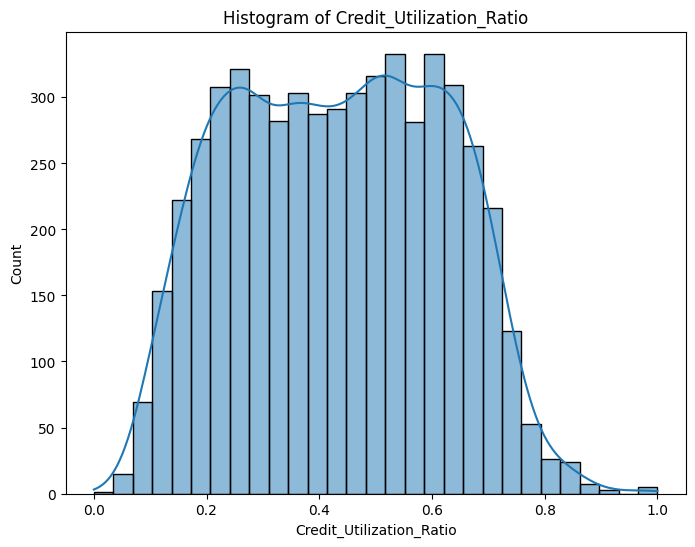

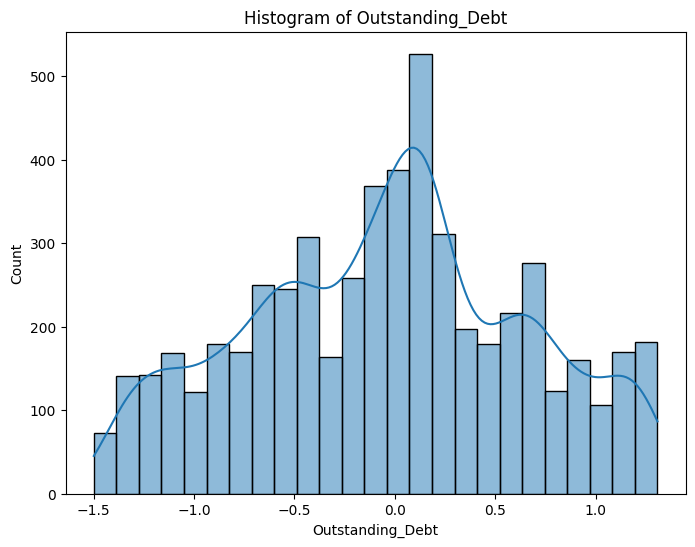

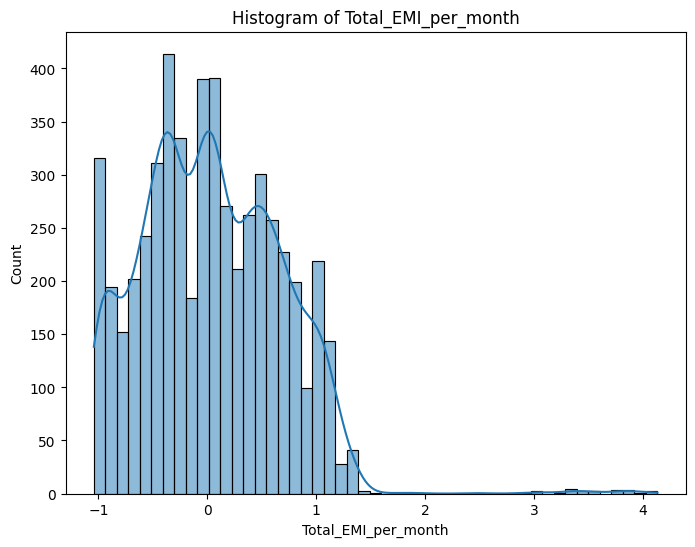

...

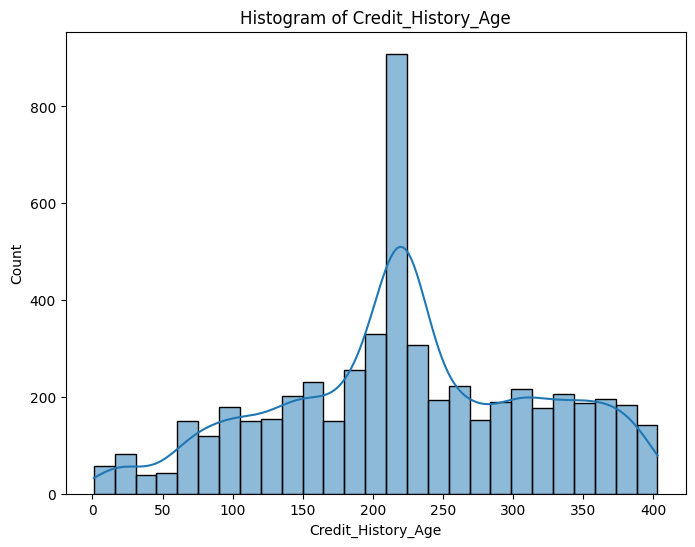

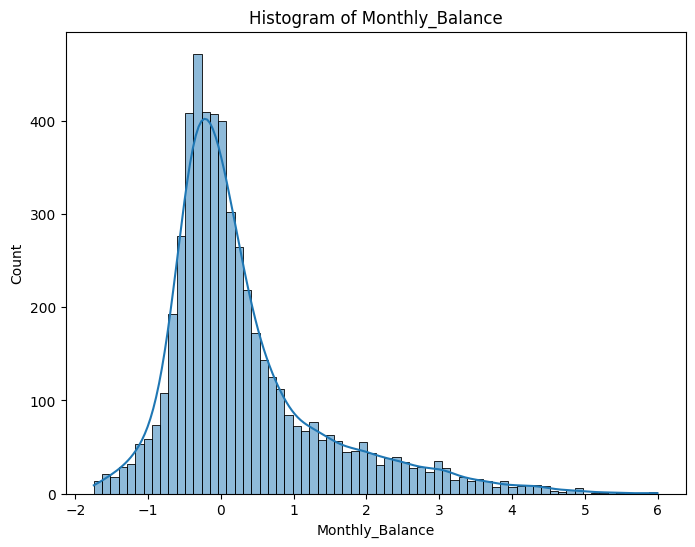

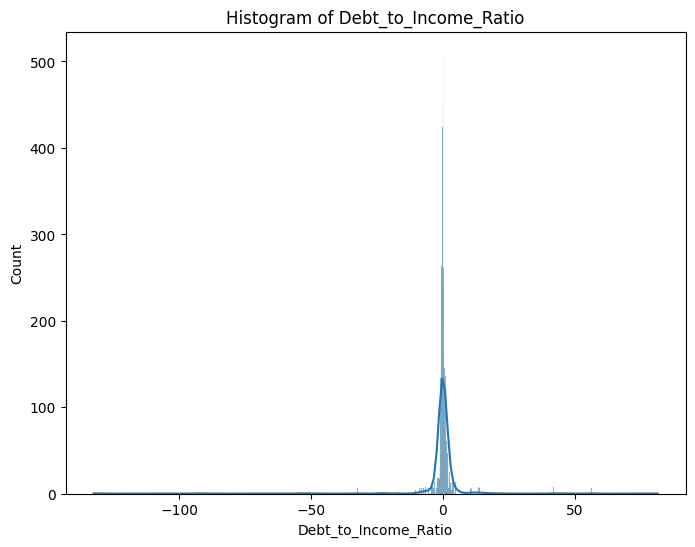

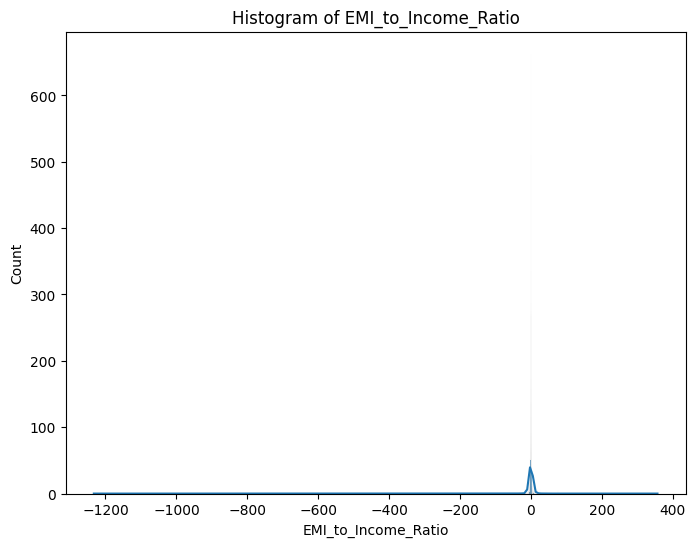

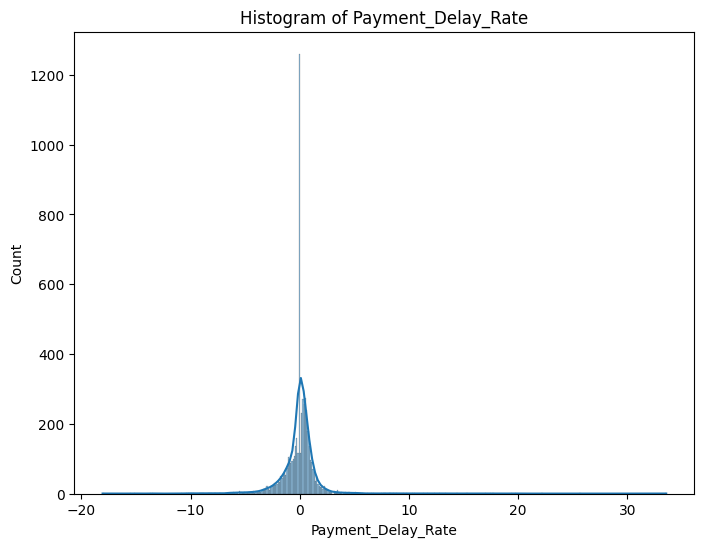

In [10]:
numeric_cols = X_train.select_dtypes(include = ["float64"]).columns

for col in numeric_cols :
    plt.figure(figsize=(8,6))
    sns.histplot(data = X_train , x= col , kde=True )
    plt.title(f"Histogram of {col}")
    plt.show()

---
### <u>`ii` Check outliers:</u>

In [11]:
numeric_cols = X_train.select_dtypes(include=["float64"])

Q1 = numeric_cols.quantile(0.25)
Q3 = numeric_cols.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (numeric_cols < lower_bound) | (numeric_cols > upper_bound)

outlier_counts = outliers_mask.sum(axis=0)

total_rows = numeric_cols.shape[0]
outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": outlier_counts,
    "Outlier Percentage": outlier_percentage
})

outliers_summary.style.background_gradient(cmap='Blues')

,Number of Outliers,Outlier Percentage
Num_of_Delayed_Payment,335,6.184235
Delay_from_due_date,260,4.799705
Credit_Utilization_Ratio,0,0.000000
Outstanding_Debt,0,0.000000
Total_EMI_per_month,23,0.424589
Changed_Credit_Limit,27,0.498431
Annual_Income,50,0.923020
Num_Credit_Inquiries,431,7.956433
Credit_History_Age,0,0.000000
Monthly_Balance,442,8.159498


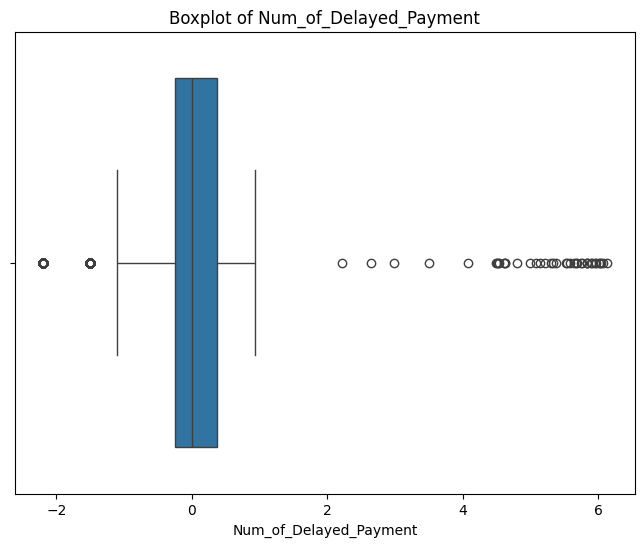

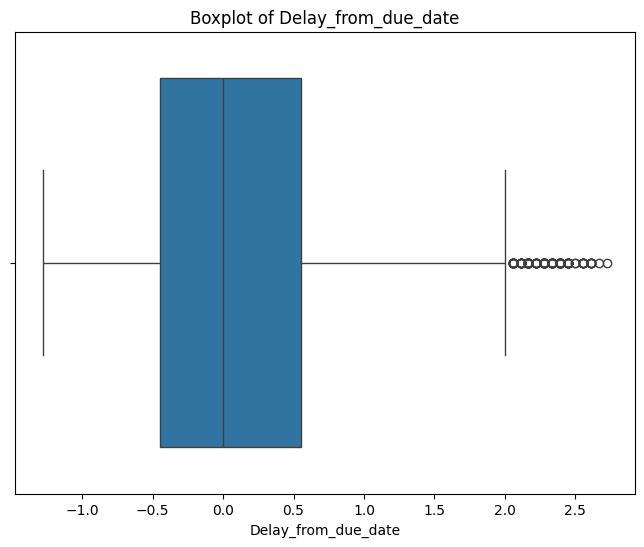

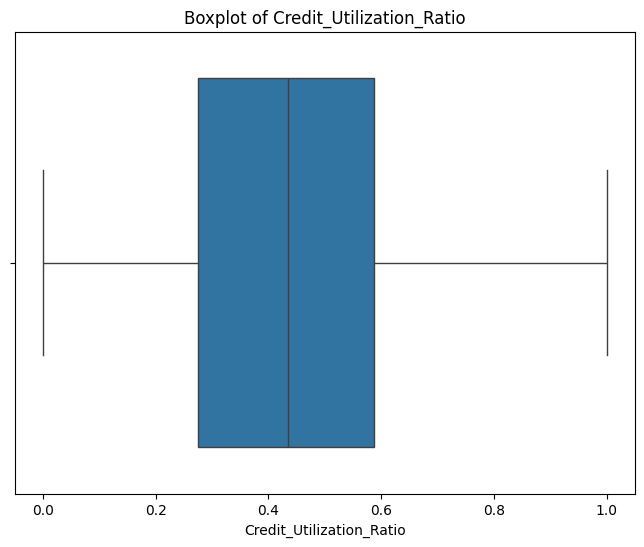

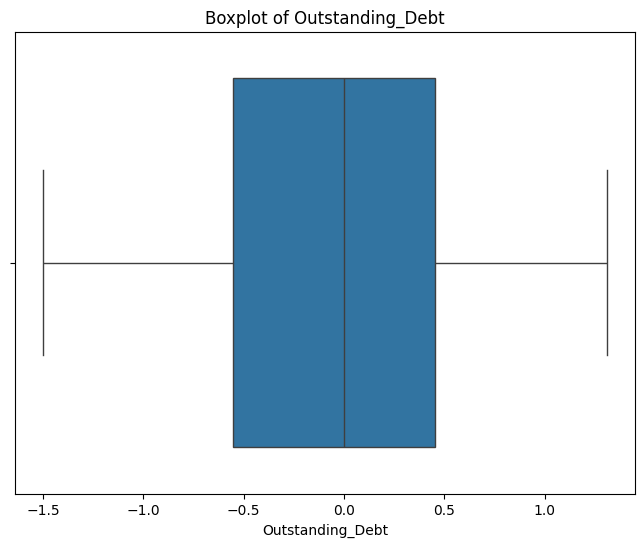

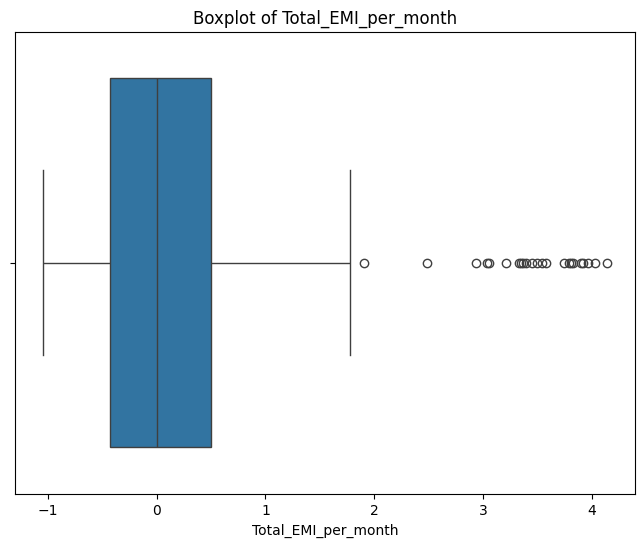

...

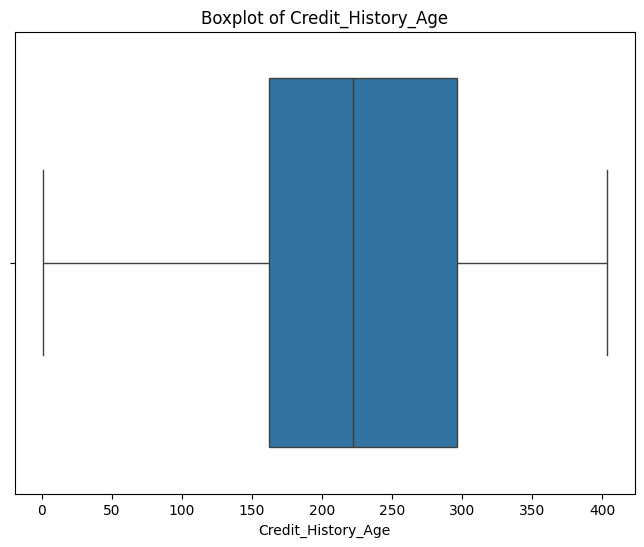

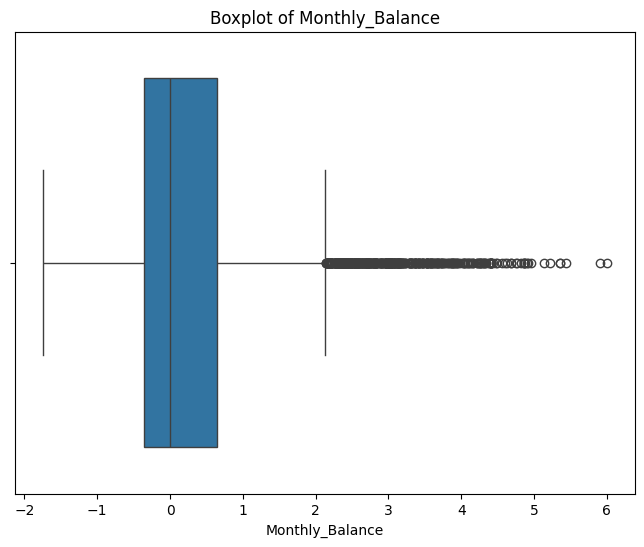

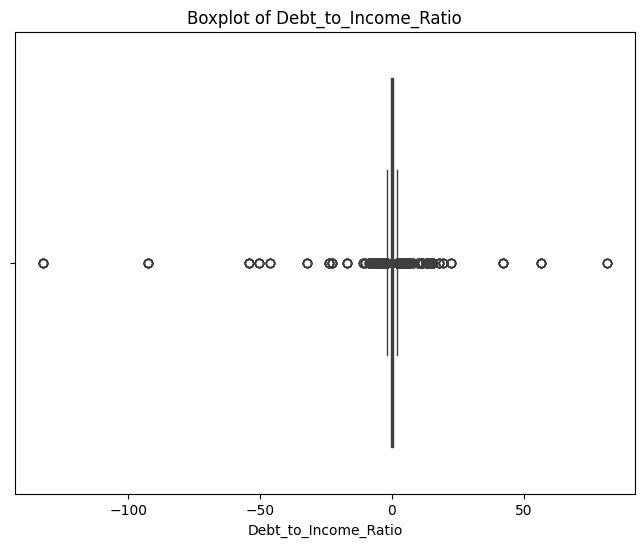

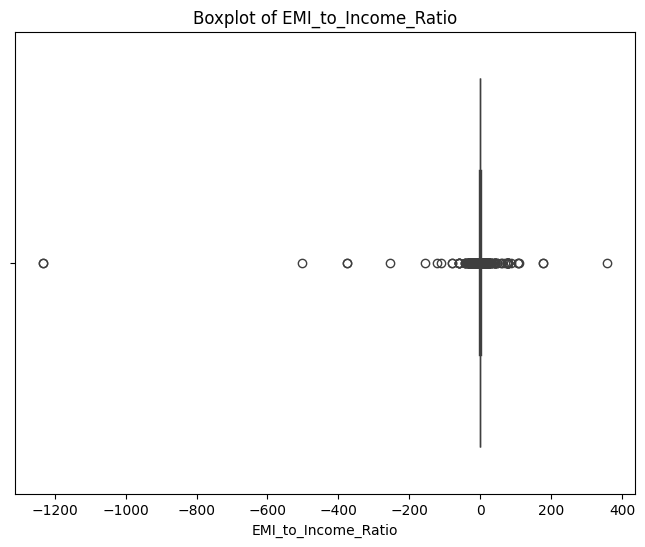

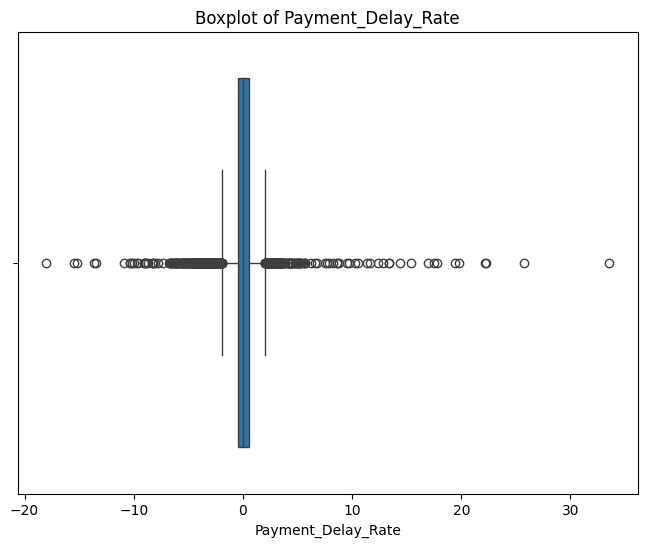

In [12]:
numeric_cols = X_train.select_dtypes(include=["float64"]).columns

for col in numeric_cols:
    plt.figure(figsize=(8, 6))

    sns.boxplot(x= X_train[col], orient="h")

    plt.xlabel(col)
    plt.title(f"Boxplot of {col}")

    plt.show()

- We donot apply log transformation for the new features,so we should apply it.

---
### <u>`iii` Analysis Report :</u>

In [13]:
report = ProfileReport(X_train, title="Credit Data Report", explorative=True)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## **`Insights:`**
### **1. General Dataset Overview**
- **5417 observations** with **14 numerical variables**.
- **No missing values** and **no duplicate rows**, ensuring data quality.

### **2. Feature Insights**

- **Delayed Payment & Debt Patterns**:
  - `Num_of_Delayed_Payment`: **23.2%** of values are **zero**, meaning many customers have no delayed payments.
  - `Delay_from_due_date`: **48.1%** of values are **negative**, indicating that nearly half of the customers make early payments.
  - `Outstanding_Debt`: **50%** of values are **negative**, suggesting many customers have net credits rather than debts.

- **Credit Utilization & Payment Behavior**:
  - `Credit_Utilization_Ratio`: Ranges from **0 to 1**, meaning full credit utilization is possible.
  - `Payment_Behaviour`: **13.7% of values are zero**, which may indicate a portion of customers with no recorded payment behavior (potentially inactive or new customers).

- **Income & Debt Metrics**:
  - `Annual_Income`: **50% negative values**, possibly indicating log-transformed data or relative deviations.
  - `Debt_to_Income_Ratio`: Skewed distribution, **49.8% negative values**, suggesting financial instability in many cases.
  - `EMI_to_Income_Ratio`: Highly skewed, **49.9% negative values**, showing a mix of overleveraged and financially stable customers.


---
### <u>`iv` Correlation Matrix :</u>

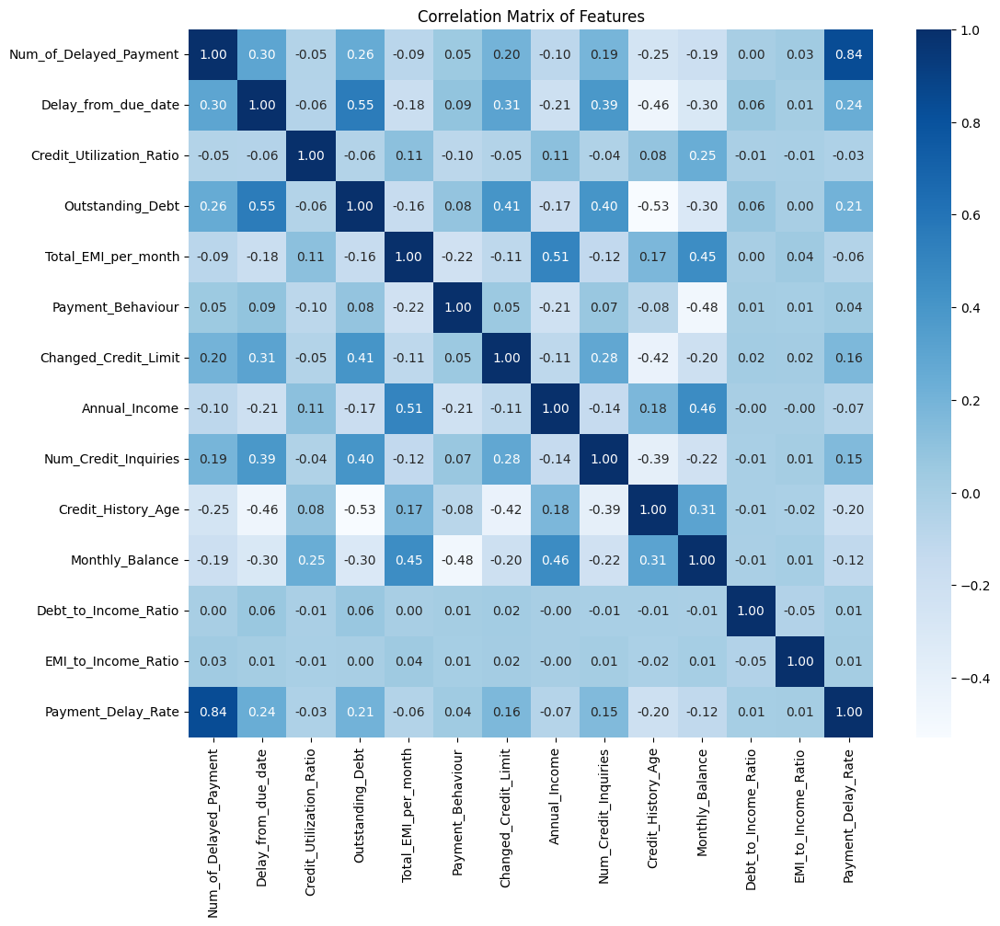

In [14]:
plt.figure(figsize=(12, 10))
correlations = X_train.corr()
sns.heatmap(correlations, annot=True, cmap='Blues', fmt=".2f")
plt.title("Correlation Matrix of Features")
plt.show()


- **High correlation variables**:
  - `Num_of_Delayed_Payment`, `Delay_from_due_date`, `Outstanding_Debt`, `Total_EMI_per_month`, `Payment_Behaviour`, `Annual_Income`, `Debt_to_Income_Ratio`, `EMI_to_Income_Ratio`, and `Payment_Delay_Rate` show strong relationships.
  - These variables are likely significant in understanding financial behaviors.


----------------

# `04` Data Preparation

Perform data cleaning, feature engineering, scaling, dropping unwanted columns (such as IDs), etc. as needed to make sure it's ready for the model.

`Q` Is this dataset *skewed*?

Hints:
- It could be helpful to check `sklearn.preprocessing` module.
- Remember that Support Vector Machine classifiers require special preprocessing.

In [15]:
# List of features to apply log transformation
features_to_transform = ["Debt_to_Income_Ratio", "EMI_to_Income_Ratio", "Payment_Delay_Rate"]

# Apply log1p transformation
X_train[features_to_transform] = X_train[features_to_transform].apply(lambda x: np.log1p(x))


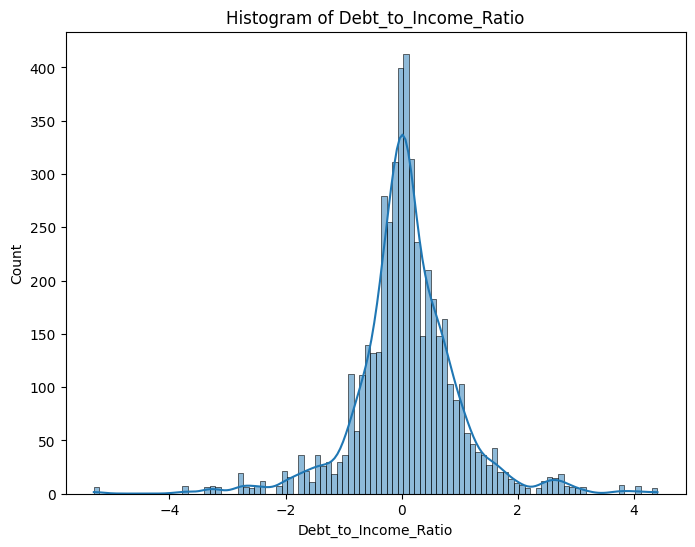

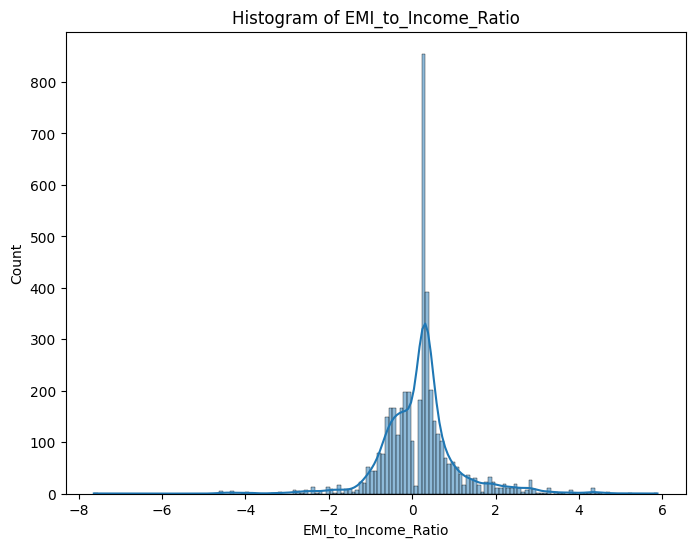

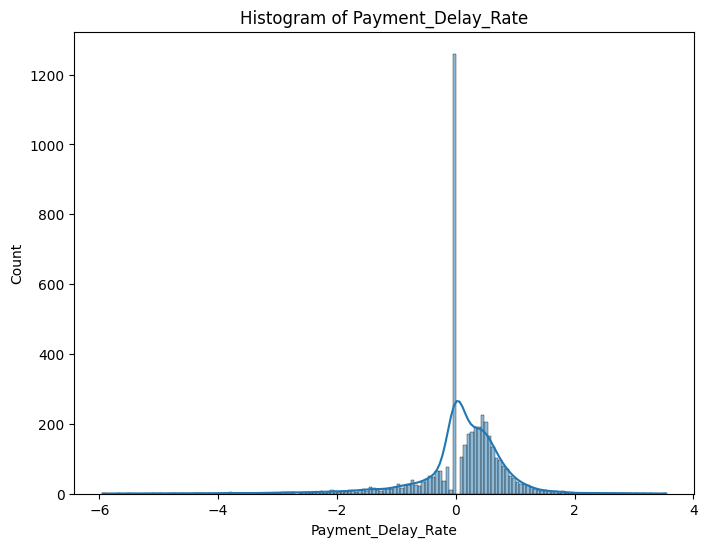

In [16]:
for col in features_to_transform :
    plt.figure(figsize=(8,6))
    sns.histplot(data = X_train , x= col , kde=True )
    plt.title(f"Histogram of {col}")
    plt.show()

In [17]:
# Replace infinite values with NaN
X_train.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values with a suitable value, e.g., the median
X_train.fillna(X_train.median(), inplace=True)

In [18]:
# Remove outliers that is not significant
columns_to_remove_outliers = ["Num_of_Delayed_Payment", "Num_Credit_Inquiries", "Monthly_Balance", "Payment_Delay_Rate"]

for col in columns_to_remove_outliers:
    Q1 = X_train[col].quantile(0.25)
    Q3 = X_train[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    X_train = X_train[(X_train[col] >= lower_bound) & (X_train[col] <= upper_bound)]
    y_train = y_train.loc[X_train.index]


In [19]:
# Clipping outliers that have affection
columns_to_clip = ["Debt_to_Income_Ratio", "EMI_to_Income_Ratio", "Payment_Delay_Rate"]

from scipy.stats.mstats import winsorize

for col in columns_to_clip:
    X_train[col] = winsorize(X_train[col], limits=[0.05, 0.05])
    X_test[col] = winsorize(X_test[col], limits=[0.05, 0.05])



In [20]:
numeric_cols = X_train.select_dtypes(include=["float64"])

Q1 = numeric_cols.quantile(0.25)
Q3 = numeric_cols.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_mask = (numeric_cols < lower_bound) | (numeric_cols > upper_bound)

outlier_counts = outliers_mask.sum(axis=0)

total_rows = numeric_cols.shape[0]
outlier_percentage = (outlier_counts / total_rows) * 100

outliers_summary = pd.DataFrame({
    "Number of Outliers": outlier_counts,
    "Outlier Percentage": outlier_percentage
})

outliers_summary.style.background_gradient(cmap='Blues')

,Number of Outliers,Outlier Percentage
Num_of_Delayed_Payment,326,8.469732
Delay_from_due_date,213,5.533905
Credit_Utilization_Ratio,0,0.000000
Outstanding_Debt,0,0.000000
Total_EMI_per_month,20,0.519615
Changed_Credit_Limit,6,0.155885
Annual_Income,39,1.013250
Num_Credit_Inquiries,1,0.025981
Credit_History_Age,0,0.000000
Monthly_Balance,180,4.676539


In [21]:
y_train.value_counts()

,count
Credit_Score,
2,2004
1,1263
0,581
3,1


In [22]:
y_train = y_train.astype(int)

In [23]:
# Access the 'Credit_Score' column
mask = y_train['Credit_Score'] != 3

X_train = X_train.loc[mask]
y_train = y_train.loc[mask]

In [48]:
#Deal with imbalanced data
smote = SMOTE(random_state=42, k_neighbors=3)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

## `#` Prepare Test Set

Apply the data transformations you used on the training set to the test set.

**Important Note:** DO NOT use `fit` on the test set.

In [25]:
# List of features to apply log transformation
features_to_transform = ["Debt_to_Income_Ratio", "EMI_to_Income_Ratio", "Payment_Delay_Rate"]

# Apply log1p transformation
X_test[features_to_transform] = X_test[features_to_transform].apply(lambda x: np.log1p(x))

In [26]:
# Replace infinite values with NaN
X_test.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values with a suitable value, e.g., the median
X_test.fillna(X_train.median(), inplace=True)

In [27]:
# Remove outliers that is not significant
for col in columns_to_remove_outliers:
    Q1 = X_train[col].quantile(0.25)
    Q3 = X_train[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    X_test = X_test[(X_test[col] >= lower_bound) & (X_test[col] <= upper_bound)]
    y_test = y_test.loc[X_test.index]

In [28]:
y_test = y_test.astype(int)

In [29]:
y_test.value_counts()

,count
Credit_Score,
2,412
1,310
0,105


----------------------

# `05` Linear Support Vector Machine Classifier

Using `sklearn` implementation of linear support vector machine classifiers to model the data.

Hint: Look for `sklearn.svm.LinearSVC` class.

## `i` Baseline Model Training

Initializing the model with initial parameters, fitting it to the training data, and get a baseline model.

Use:
- `random_state` $= 1234$

 `i` Linear SVM :

In [52]:
# Initialize the LinearSVC model
model_svm = LinearSVC(C=3792.690190732246, class_weight='balanced', dual=False, max_iter=2000, random_state=1234)
# Fit the model to the training data
model_svm.fit(X_train, y_train.values.ravel())

# Predict on the test data
y_pred_svm = model_svm.predict(X_test)

## `ii` Model Evaluation

Evaluate the baseline model performance using classification metrics, e.g. **Accuracy**, **Precision**, $F_1 \space Score$, **Confusion Matrix** etc.

Which metric is more reliable?

In [53]:
accuracy = accuracy_score(y_test, y_pred_svm)
precision = precision_score(y_test, y_pred_svm, average='weighted')
recall = recall_score(y_test, y_pred_svm, average='weighted')
f1 = f1_score(y_test, y_pred_svm, average='weighted')
conf_matrix = confusion_matrix(y_test,y_pred_svm)

print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print('Confusion Matrix:')
print(conf_matrix)

Accuracy: 0.6070
Precision: 0.6341
Recall: 0.6070
F1 Score: 0.6121
Confusion Matrix:
[[ 63   5  37]
 [ 23 220  67]
 [ 89 104 219]]


----------------------

# `06` Kernelized Support Vector Machine Classifier

Using `sklearn` implementation of kernelized support vector machine classifiers to model the data.

Hint: Look for `sklearn.svm.SVC` class.

## `i` Baseline Model Training

Initializing the model with initial parameters, fitting it to the training data, and get a baseline model.

Use:
- `random_state` $= 1234$
- `kernel` = 'linear'

`ii` SVC Linear


In [54]:
# Initialize the SVC model with a linear kernel
model_svc = SVC(C=0.004832930238571752, class_weight='balanced', kernel='linear', max_iter=2000, random_state=1234)

# Fit the model to the training data
model_svc.fit(X_train, y_train.values.ravel())

# Predict on the test data
y_pred_svc = model_svc.predict(X_test)


## `ii` Model Evaluation

Evaluate the baseline model performance using classification metrics, e.g. **Accuracy**, **Precision**, $F_1 \space Score$, **Confusion Matrix** etc.

`Q` Which metric is more reliable?
`Q` Compare the results to those of `sklearn.svm.LinearSVC` class. Also, is there a difference in the training time?

In [55]:
accuracy = accuracy_score(y_test, y_pred_svc)
precision = precision_score(y_test, y_pred_svc, average='weighted')
recall = recall_score(y_test, y_pred_svc, average='weighted')
f1 = f1_score(y_test, y_pred_svc, average='weighted')
conf_matrix = confusion_matrix(y_test,y_pred_svc)

print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print('Confusion Matrix:')
print(conf_matrix)

Accuracy: 0.4087
Precision: 0.5765
Recall: 0.4087
F1 Score: 0.3880
Confusion Matrix:
[[ 42   0  63]
 [ 87  38 185]
 [145   9 258]]


## `iii` Kernelization Mode: On

Let's try the both `poly` and `rbf` kernels. Use default $C, \gamma, \space and/or \space degree$ parameter(s) for simplicity if you want. Does kernelization make the model better?

Which of the two kernels performs better?

`iii` SVC Poly :
    

In [56]:
model_poly = SVC( C=0.004832930238571752, class_weight='balanced', max_iter=2000, random_state=1234, kernel = 'poly')
# Fit the model to the training data
model_poly.fit(X_train, y_train.values.ravel())

# Predict on the test data
y_pred_poly = model_poly.predict(X_test)

In [57]:
accuracy = accuracy_score(y_test, y_pred_poly)
precision = precision_score(y_test, y_pred_poly, average='weighted')
recall = recall_score(y_test, y_pred_poly, average='weighted')
f1 = f1_score(y_test, y_pred_poly, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred_poly)

print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print('Confusion Matrix:')
print(conf_matrix)

Accuracy: 0.4438
Precision: 0.2742
Recall: 0.4438
F1 Score: 0.3387
Confusion Matrix:
[[ 42   0  63]
 [ 16   0 294]
 [ 87   0 325]]


---
`iv` SVC RBF :

In [58]:
model_rbf = SVC( C=0.004832930238571752, class_weight='balanced', max_iter=2000, random_state=1234, kernel = 'rbf')
# Fit the model to the training data
model_rbf.fit(X_train, y_train.values.ravel())

# Predict on the test data
y_pred_rbf = model_rbf.predict(X_test)

In [59]:
accuracy = accuracy_score(y_test, y_pred_rbf)
precision = precision_score(y_test, y_pred_rbf, average='weighted')
recall = recall_score(y_test, y_pred_rbf, average='weighted')
f1 = f1_score(y_test, y_pred_rbf, average='weighted')
conf_matrix = confusion_matrix(y_test,y_pred_rbf)

print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print('Confusion Matrix:')
print(conf_matrix)

Accuracy: 0.1270
Precision: 0.0161
Recall: 0.1270
F1 Score: 0.0286
Confusion Matrix:
[[105   0   0]
 [310   0   0]
 [412   0   0]]


## `iv` Tuning Hyperparameters

Try different  $C, \gamma, \space and/or \space degree$ values and evaluate. What is the best hyperparamters value combination?

Remember that $alpha=\frac{1}{C}$ which means less regularization for higher $C$ values.

`Hint:` Make sure to tune only relevant hyperparameters per kernel (e.g., don't tune different values for `degree` while using `rbf` kernel)

`Note:` You can tune other parameters as you see fit (but make sure you elaborate your reasoning.

Hint: You might want to use `sklearn.model_selection.RandomizedSearchCV` or `sklearn.model_selection.GridSearchCV` classes.

In [60]:
# Define the parameter grid
param_grid = {
    'C': np.logspace(-4, 4, 20),
    'penalty': ['l1', 'l2'],
    'dual': [False]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    LinearSVC(random_state=1234, class_weight="balanced", max_iter=2000),
    param_distributions=param_grid,
    n_iter=20,
    cv=5,
    scoring='accuracy',
    random_state=42
)

# Fit the model
random_search.fit(X_train, y_train.values.ravel())

# Print best parameters
print("Best Parameters:", random_search.best_params_)

# Best model
best_svc = random_search.best_estimator_
best_svc.fit(X_train, y_train)


Best Parameters: {'penalty': 'l2', 'dual': False, 'C': 0.004832930238571752}


LinearSVC(C=0.004832930238571752, class_weight='balanced', dual=False,
          max_iter=2000, random_state=1234)

In [61]:
# Define the parameter grid
param_grid = {
    'C': np.logspace(-4, 4, 20),
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    SVC(kernel="linear", random_state=1234, class_weight="balanced", max_iter=2000),
    param_distributions=param_grid,
    n_iter=20,
    cv=5,
    scoring='accuracy',
    random_state=42
)

# Fit the model
random_search.fit(X_train, y_train.values.ravel())

# Print best parameters
print("Best Parameters:", random_search.best_params_)

# Best model
best_svc = random_search.best_estimator_
best_svc.fit(X_train, y_train)

Best Parameters: {'C': 0.004832930238571752}


SVC(C=0.004832930238571752, class_weight='balanced', kernel='linear',
    max_iter=2000, random_state=1234)

------------------

# `07` Generalization Error

Now that we have tuned our solution, to an *extent*, we need to test for a final time on the held out test set.

In [64]:
models = {
    "Linear SVM": model_svm,
    "SVC Linear": model_svc,
    "SVC Poly": model_poly,
    "SVC RBF": model_rbf
}


for name, model in models.items():

    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    train_f1 = f1_score(y_train, y_train_pred, average='weighted')
    test_f1 = f1_score(y_test, y_test_pred, average='weighted')

    generalization_error = abs(train_f1 - test_f1)

    print(f"{name}:")
    print(f"  - F1 Score (Train): {train_f1:.4f}")
    print(f"  - F1 Score (Test): {test_f1:.4f}")
    print(f"  - Generalization Error: {generalization_error:.4f}")
    print("-" * 40)


Linear SVM:
  - F1 Score (Train): 0.5880
  - F1 Score (Test): 0.6121
  - Generalization Error: 0.0241
----------------------------------------
SVC Linear:
  - F1 Score (Train): 0.4005
  - F1 Score (Test): 0.3880
  - Generalization Error: 0.0126
----------------------------------------
SVC Poly:
  - F1 Score (Train): 0.3766
  - F1 Score (Test): 0.3387
  - Generalization Error: 0.0379
----------------------------------------
SVC RBF:
  - F1 Score (Train): 0.0396
  - F1 Score (Test): 0.0286
  - Generalization Error: 0.0110
----------------------------------------


----------------------------------------------

$$ Wish \space you \space all \space the \space best \space ♡ $$
